In [1]:
import numpy as np
import os
import torch

from matplotlib import pyplot as plt
%matplotlib inline

from util.dataset import SpikeDataset
import torch.utils.data.dataloader as dataloader

%load_ext autoreload
%autoreload 2

In [2]:
cnt_file = 'dataset//primer//cnt//'
stim_file = 'dataset//primer//'
# Whole dataset length: 137145
tr_start_frame = 0
tr_end_frame = 82000

val_start_frame = 82000
val_end_frame = 110000

cell_idx_list = list(range(0, 53))
nCells = len(cell_idx_list)

train_dataset = SpikeDataset(spike_rate_path=cnt_file,
                             stim_path=stim_file,
                             cell_idx=cell_idx_list,
                             win_len=5,
                             n_split=1,
                             fr_st_end=(tr_start_frame, tr_end_frame))

val_dataset = SpikeDataset(spike_rate_path=cnt_file,
                           stim_path=stim_file,
                           cell_idx=cell_idx_list,
                           n_split=1,
                           win_len=5,
                           fr_st_end=(val_start_frame, val_end_frame))

Shape of spike rate array: (82000, 53)
Shape of stim: (82000, 40, 40)
Shape of spike rate array: (28000, 53)
Shape of stim: (28000, 40, 40)


In [8]:
import torch
from util.vistools import *

# Loading model
model = torch.load('logs//run1//model.mdl')

# Evaluate model
tr_start=50000
tr_end=50500
gt_tr, pred_tr = evaluate_model(model, dataset=train_dataset, fr_start=tr_start, fr_end=tr_end)

val_start=0
val_end=500
gt_val, pred_val = evaluate_model(model, dataset=val_dataset, fr_start=val_start, fr_end=val_end)

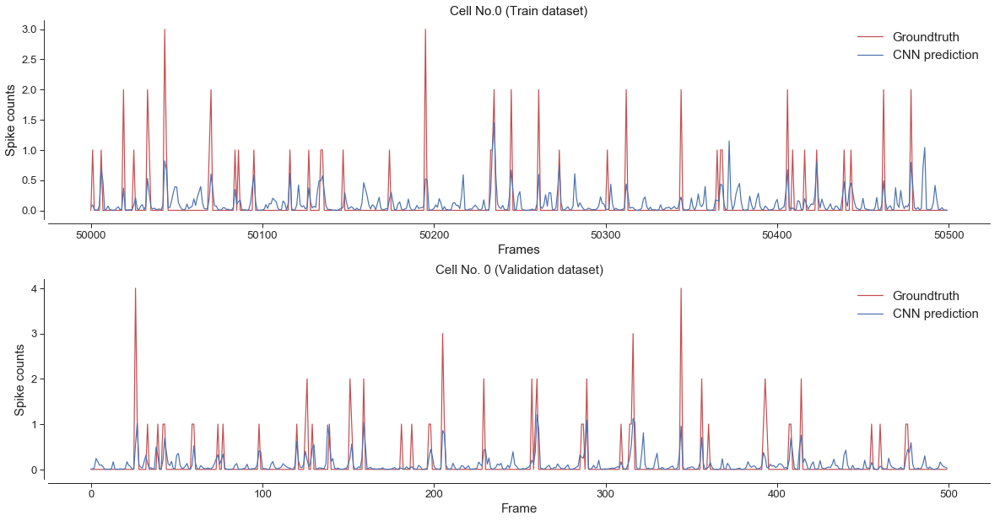

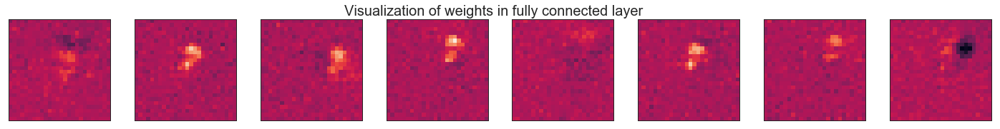

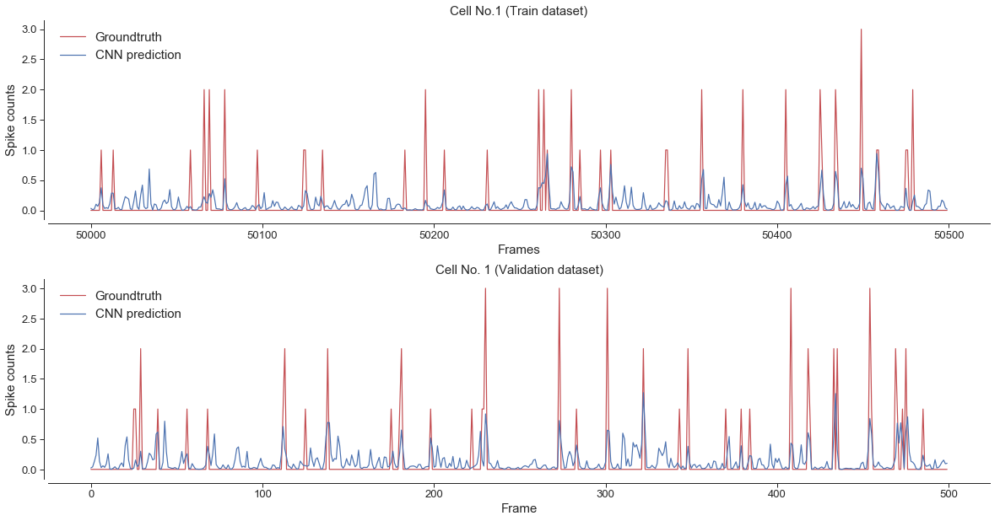

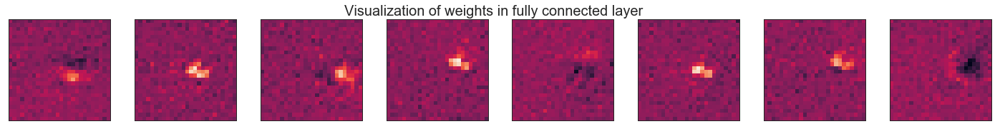

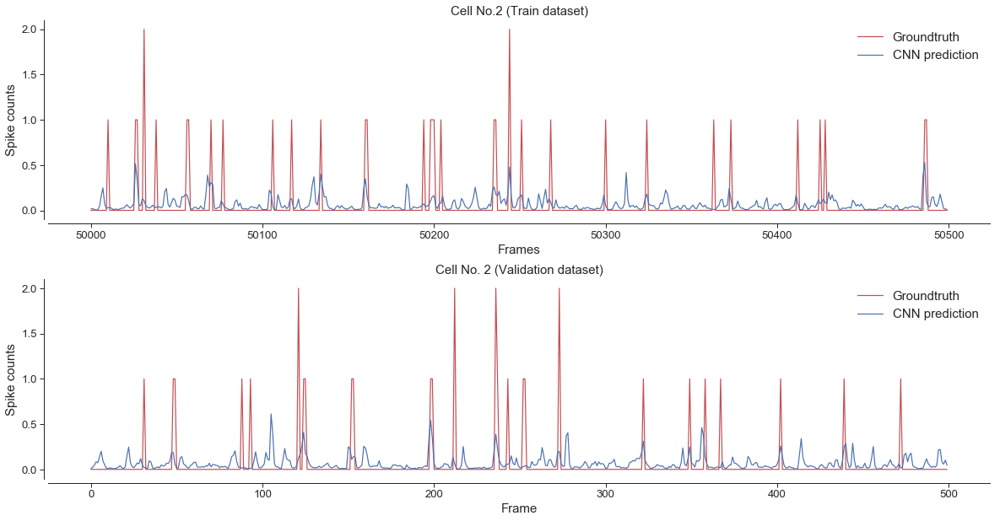

...

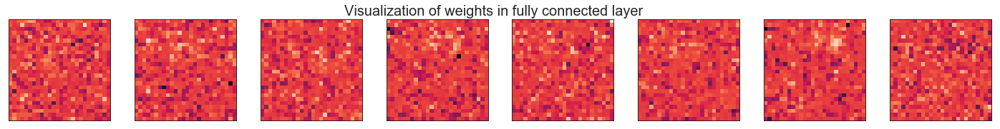

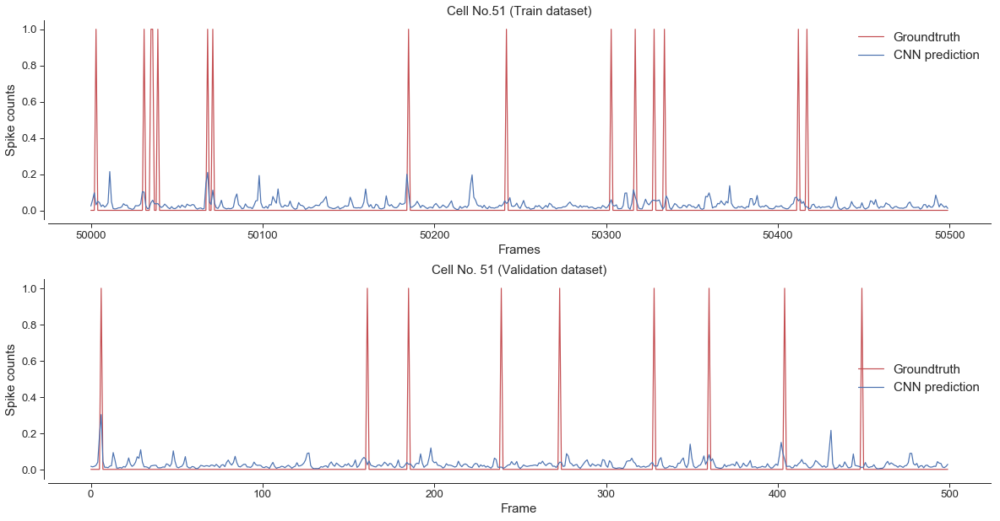

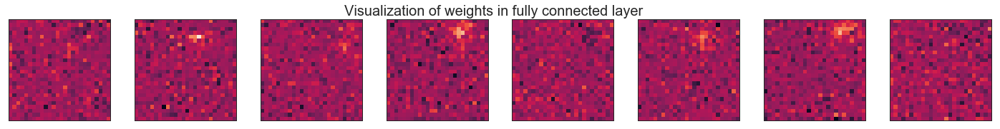

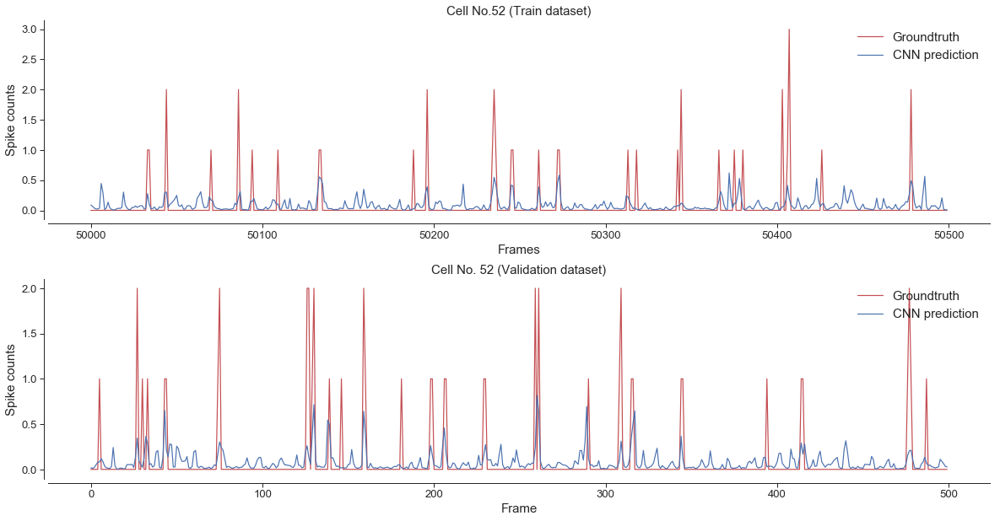

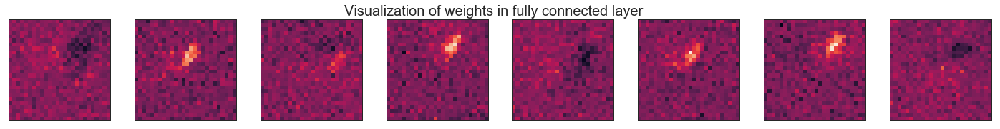

In [10]:
for idx in range(nCells):
    plot_results(model, cell_idx=idx, gt_tr=gt_tr,
                 pred_tr=pred_tr, gt_val=gt_val,
                 pred_val=pred_val, 
                 val_start=val_start,
                 tr_start=tr_start,
                 outfile='logs//run1' )

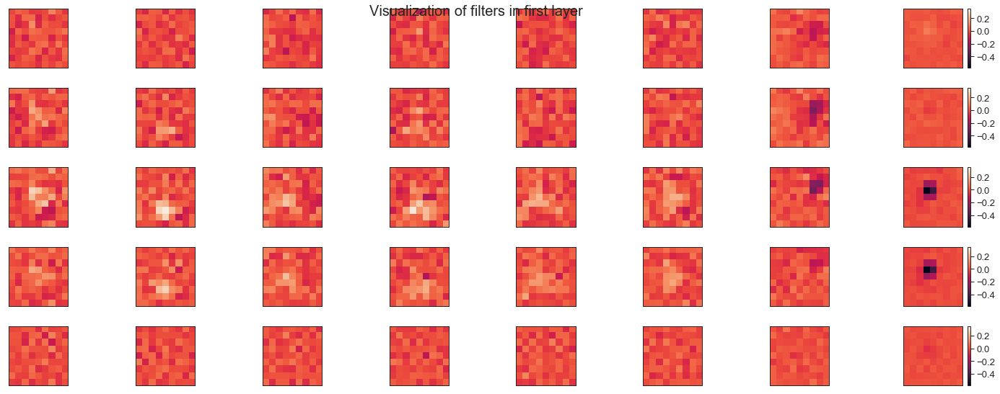

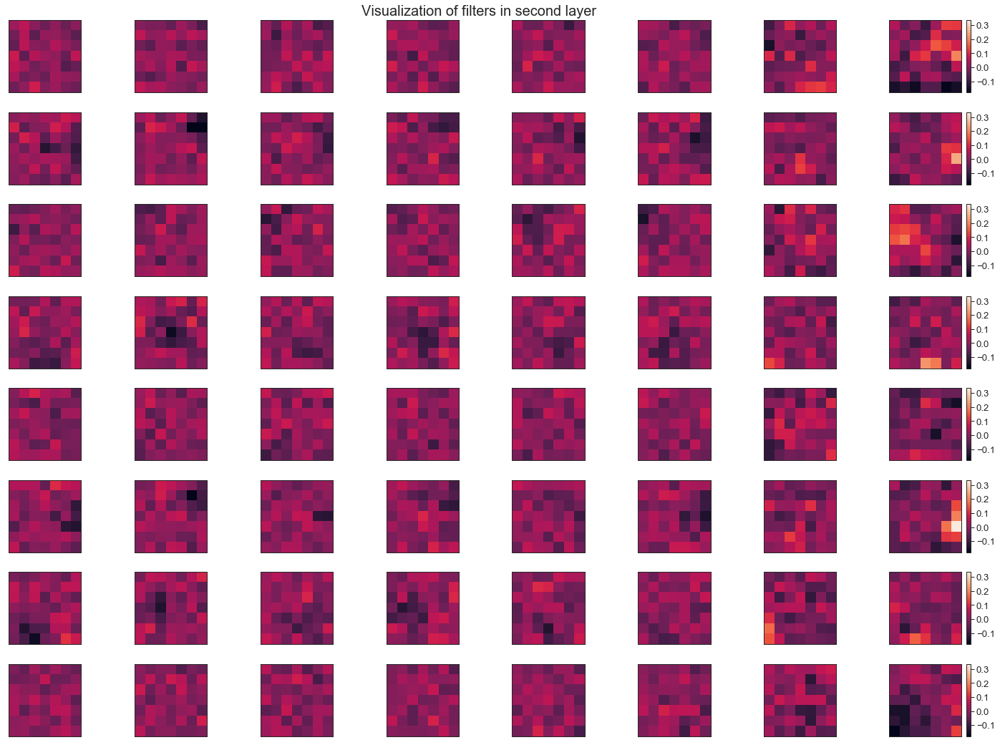

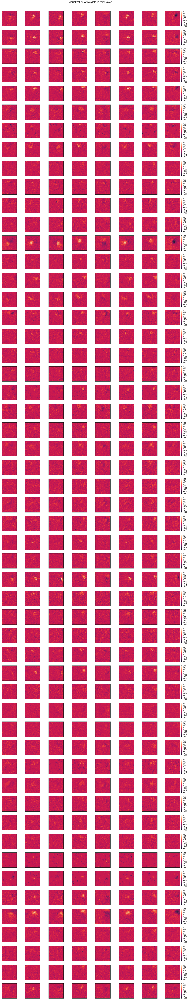

In [14]:
visualize_deep_retina(model, outfile='logs//run1')